In [5]:
# !pip install librosa
# !pip install mir_eval

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import mir_eval
from IPython.display import Audio #trabalhar com geração de áudio sintetizados por nós mesmos

In [7]:
# f(x) = A.cos(2*pi*f0*t) - equação que modela o padrão oscilatório de uma onda (pode ser senoidal ou cossenoidal)
# O A é a amplitude da onda. O 2pi significa um ciclo completo de uma onda (uma volta no círculo trigonométrica
# equivale a 2pi radianos. E nesse círculo, a altura representa o meu seno e a largura, o cosseno).
# O f0 representa a frequência fundamental da onda (medida em hertz, ou seja, a frequência por SEGUNDO).   

A_sin = 0.8 #amplitude do seno
A_cos = 1 #amplitude do cosseno
ti = 2 

f_sin = 880 #frequência criada pro seno
f_cos = 1600 #frequência criada pro cosseno

sr = 44_000 #frequência fundamental

t_sin = np.arange(0, ti, 1.0/sr) #Vou criar um intervalo de tempo variando de 0 a 2 segundos e pegar faixas
t_cos = np.arange(0, ti, 1.0/sr) # de 1/44000

sin_sig = A_sin * np.sin(2 * np.pi * f_sin * t_sin) #Criando o sinal de seno e cosseno, de acordo com a fórmula
cos_sig = A_cos * np.cos(2 * np.pi * f_cos * t_cos)

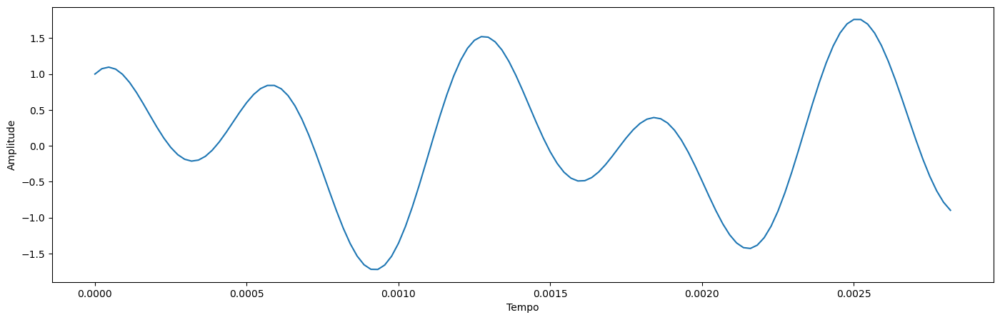

In [9]:
# Vou plotar no gráfico. Normalmente enxergamos sinais de onda com o seno e cosseno somados.
# Nunca com cada um isolado.
sin_cos_sig = sin_sig + cos_sig

f, ax = plt.subplots(figsize=(17,5))
plt.plot(t_cos[0:125], sin_cos_sig[:125])
plt.xlabel("Tempo")
plt.ylabel("Amplitude")
plt.show()

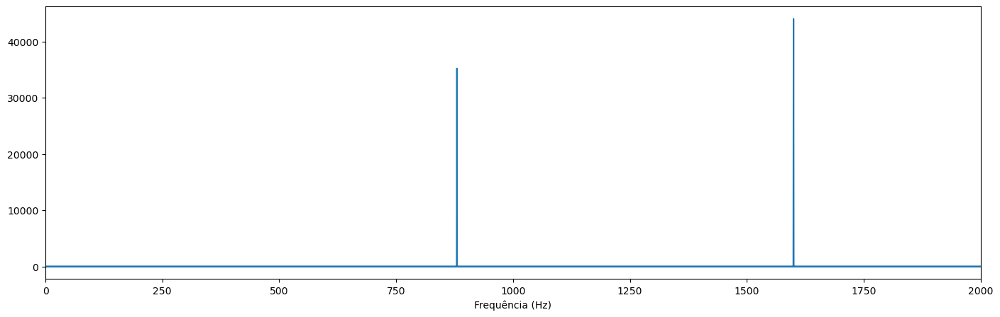

In [10]:
#Agora vamos usar a transformada rápida de fourrier (fft), pois pretendemos evitar trabalhar com
# o sinal oscilatorio no tempo, para trabalhar com o sinal oscilatorio na frequência. É muito menos complexo.

sin_cos_fft = np.fft.fft(sin_cos_sig)

sin_cos_fft_freq = np.fft.fftfreq(n=sin_cos_sig.size, d = 1/sr)

f, ax = plt.subplots(figsize = (17,5))
plt.plot(sin_cos_fft_freq, abs(sin_cos_fft), label = "Parte Imaginária")

plt.xlim(0,2000)
plt.xlabel("Frequência (Hz)")
plt.show()

#podemos ver que ele mostra direitinho a frequência que estabelecemos pro seno e cosseno lá em cima (880 e 1600)

In [11]:
# Agora vamos usar a lib Audio para gerar o output da função (no caso, a seno e cosseno que criamos)

Audio(data = sin_cos_sig, rate = sr)

In [17]:
# construir um som. k = nota musical e t = Duração da nota
def make_sound(k, t):
    A = 1
    freqs = dict(C = 261.63, #Dó
                 D = 293.66, #Ré
                 E = 329.63, #Mi
                 F = 349.23, #Fá
                 G = 392.00) #Sol
    
    sr = 44_000
    ts = np.arange(0, t, 1.0/sr)
    #Sinal seno
    sig = A * np.sin(2 * np.pi * freqs[k] * ts)
    return sig


In [24]:
Audio(data = make_sound("E", 4) + make_sound("C", 4) + make_sound("G", 4), rate = 44_000)

In [47]:
#Usando biblioteca librosa para trabalhar com áudios. Vamos buscar esse som "vibeace" e salvar
# sua freq e a freq fundamental
y, sr = librosa.load(librosa.example("vibeace", hq=True))

In [27]:
print(type(sr), type(y))
print(sr)
print(y)

<class 'int'> <class 'numpy.ndarray'>
22050
[ 1.3642421e-12  8.1854523e-12  1.1823431e-11 ...  8.7291285e-15
 -1.3877788e-14  4.5397713e-15]


In [25]:
Audio(data = y, rate = sr)

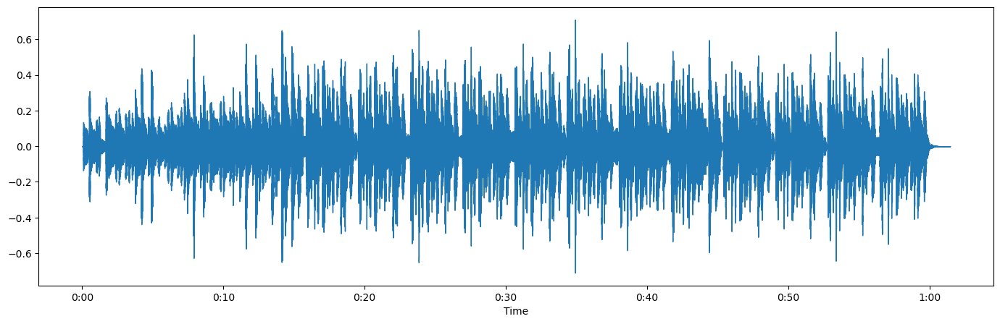

In [28]:
#Agora vamos plotar o padrão oscilatorio da onda no tempo, pra comparar com aquela onda super simples anterior.
f, ax = plt.subplots(figsize = (17,5))
librosa.display.waveshow(y, sr = sr)

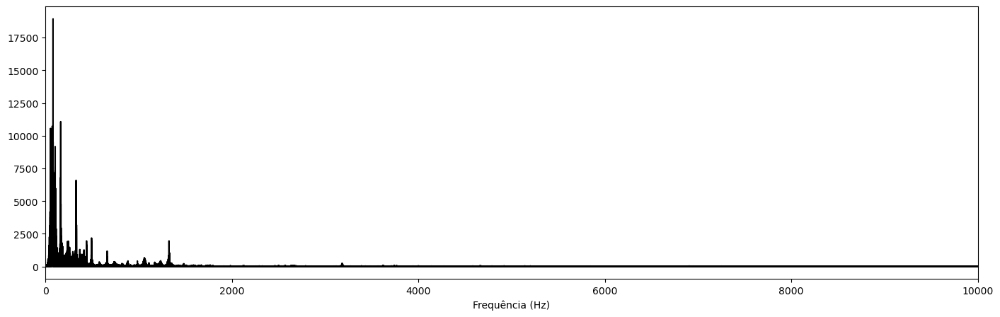

In [32]:
#agora, aplicando a transformada rápida de fourier, vamos simplificar a visualização do padrão oscilatório
# da onda, saindo do tempo e indo pra frequência.

audio_fft = np.fft.fft(y)

audio_fft_freq = np.fft.fftfreq(n=y.size, d = 1/sr)

f, ax = plt.subplots(figsize = (17,5))
plt.plot(audio_fft_freq, abs(audio_fft), color = "black", label = "Parte Imaginária")

plt.xlim(0,10_000)
plt.xlabel("Frequência (Hz)")
plt.show()

#É possível perceber que há muitas faixas de frequência, diferente de só duas de seno e cosseno que foi criada.
# A linha preta mostra a magnitude do sinal de áudio para cada frequência. Os picos na linha indicam as
# frequências dominantes no sinal de áudio, ou seja, as frequências que possuem maior amplitude

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_4884\3462030272.py:3: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  log_power = librosa.amplitude_to_db(D**2, ref = np.max)


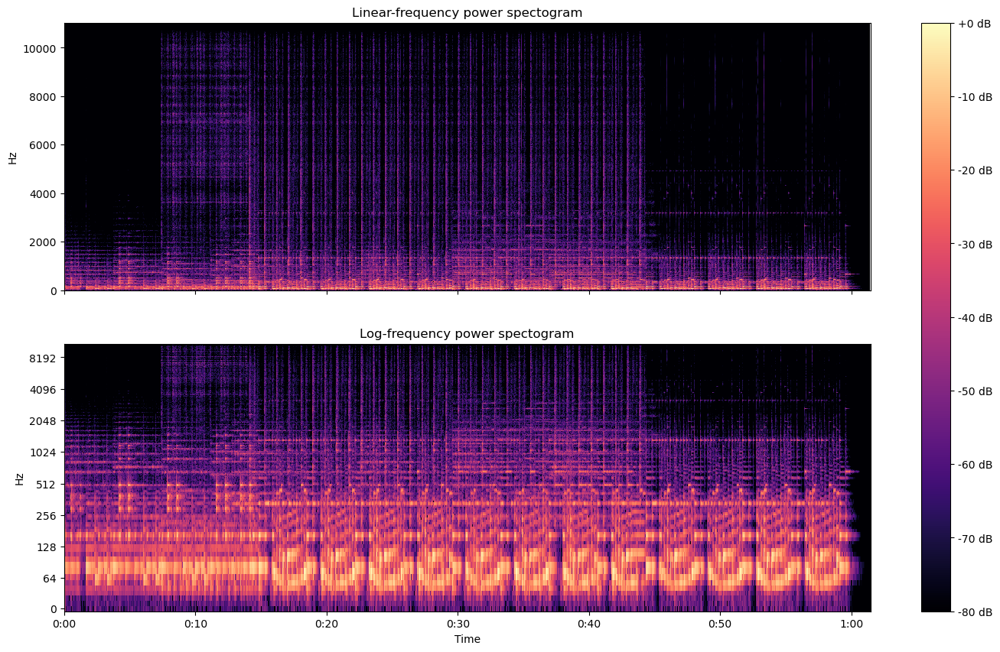

In [36]:
#Algo mais elaborado para criar um spectograma, pois não devemos ficar olhando gráficos como os de cima
D = librosa.stft(y)
log_power = librosa.amplitude_to_db(D**2, ref = np.max)

#Plotando 
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(17,10))

#Frequência linear
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
img = librosa.display.specshow(D, y_axis="linear", x_axis="time",
                               sr=sr, ax=ax[0])
ax[0].set(title="Linear-frequency power spectogram")
ax[0].label_outer()

#Frequência transformada em log
hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(y, hop_length=hop_length)),
                            ref=np.max)
librosa.display.specshow(D, y_axis="log", hop_length=hop_length,
                         x_axis="time", sr=sr, ax=ax[1])
ax[1].set(title="Log-frequency power spectogram")
ax[1].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

In [38]:
# Esse código também analisa o sinal de áudio, mas dessa vez gera dois gráficos diferentes, cada
# um com uma representação diferente do sinal de áudio.

# O primeiro gráfico é um espectrograma de potência de frequência linear, onde a escala
#  da frequência é linear e as unidades da amplitude são em potência. É gerado a partir da
#  Transformada de Fourier de curto tempo (STFT) do sinal de áudio. A STFT divide o sinal em 
# pequenos segmentos e calcula a Transformada de Fourier para cada segmento. O gráfico mostra a
#  energia de cada frequência ao longo do tempo. As cores mais claras indicam maior energia em uma 
# determinada frequência em um determinado momento. Este gráfico é útil para analisar o conteúdo de 
# frequência de um sinal de áudio em detalhes.

# O segundo gráfico é um espectrograma de potência de frequência logarítmica, onde a escala da frequência
#  é logarítmica e as unidades da amplitude são em potência. Ele é gerado usando o mesmo processo que
#  o primeiro gráfico, mas a escala da frequência é logarítmica. Esse tipo de gráfico é útil para visualizar
#  uma ampla gama de frequências em uma única imagem. O eixo y é representado em escala logarítmica,
#  o que significa que as frequências mais baixas são exibidas na parte inferior do eixo e as frequências
#  mais altas na parte superior. As cores mais claras indicam maior energia em uma determinada faixa de 
# frequência em um determinado momento. Este gráfico é particularmente útil para analisar sons de baixa
#  frequência, como os graves.

# Ambos os gráficos têm um eixo x que representa o tempo em segundos. A escala de tempo é a mesma nos
#  dois gráficos. As cores são representadas em decibéis (dB) e a cor da barra lateral indica a escala 
# de decibéis usada.

In [39]:
#Aqui, podemos continuar analisando audios, quebrando ele na parte harmônica e na parte percussiva
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [40]:
Audio(data=y_harmonic, rate=sr)

In [41]:
Audio(data=y_percussive, rate=sr)

In [50]:
#Tempo e batidas
#Executa o rastreamento de batida e retorna o tempo estimado e as posições de batida.
e = librosa.onset.onset_strength(y=y,sr=sr)
tempo, batida = librosa.beat.beat_track(onset_envelope=e)
print(tempo, batida)

129.19921875 [   4   23   43   63   83  102  122  142  162  181  202  222  242  261
  281  301  321  341  361  382  401  421  441  461  480  500  520  540
  560  579  600  620  639  658  678  698  718  737  757  777  798  817
  837  857  877  896  916  936  957  976  996 1016 1036 1055 1075 1095
 1116 1135 1155 1175 1195 1214 1234 1254 1275 1294 1314 1334 1354 1373
 1393 1413 1434 1453 1473 1493 1513 1532 1552 1572 1593 1612 1632 1652
 1672 1691 1712 1732 1752 1771 1791 1811 1831 1850 1870 1890 1911 1931
 1951 1971 1990 2010 2030 2050 2070 2090 2110 2130 2149 2169 2189 2209
 2229 2249 2269 2288 2308 2328 2348 2368 2388 2408 2428 2448 2467 2487
 2507 2527 2547]


In [52]:
#Criamos um som de click e inserimos uma batida no audio anterior
beat_times = librosa.frames_to_time(batida)
y_click = mir_eval.sonify.clicks(beat_times, sr, length=len(y))
Audio(data=y+y_click, rate=sr)

In [53]:
#Agora pegamos só a percussão e inserimos o click.
Audio(data=y_percussive+y_click, rate=sr)